In [0]:
%cd /content
from IPython.display import clear_output

#imports
#!pip install librosa
!pip install webrtcvad
import webrtcvad
!pip install --upgrade librosa
import librosa 
import scipy
import numpy as np
from IPython.display import Audio
import matplotlib.pyplot as plt
from math import ceil 
import matplotlib.patches as mpatches

clear_output()

In [0]:
#local modules
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/detect_pitch.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/modified_psola.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/vad.py

#audios
!wget "https://raw.githubusercontent.com/vicaub/Pitch-Estimation-and-Voicing-Detection/master/data/fda_ue/rl047.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/harry_potter_es.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/hunger_games_en.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/shh.wav"

clear_output()

In [0]:
from modified_psola import modified_psola
from detect_pitch import get_fundamental_frequency
from vad import float2pcm, pcm2float, frame_generator, join_vad_frames, get_vad_frames
from vad import Frame
from scipy import signal

clear_output()

In [0]:
def plot_voiced_regs(regions, is_frame_speech, audio_f):
  plt.figure(figsize=(20, 5))
  green_patch = mpatches.Patch(color='green', label='sonoro')
  red_patch = mpatches.Patch(color='red', label='no-sonoro')
  plt.legend(handles=[green_patch, red_patch])
  plt.xlabel("muestras")
  plt.ylabel("amplitud")

  #ploteo regiones sonoras y no sonoras
  for i,reg in enumerate(regions):
    start,end = reg  
    if start < 1000000 and end < 1000000:
      if(is_frame_speech[start] == True):
        # plt.vlines(x=start, ymin=0, ymax=1.0)
        plt.hlines(y=0.65, xmin=start, xmax=end, linewidth=3, colors='g')
        # plt.vlines(x=end, ymin=0, ymax=1.0)
      else:
        plt.hlines(y=0.65, xmin=start, xmax=end, linewidth=3, colors='r')

    
  plt.plot(audio_f[:1000000])
  plt.grid()
  plt.figure()

In [0]:
def speed_up(audio_path, speed, sample_rate):

  audio_file = audio_path
  audio_f, _ = librosa.load(audio_file, sr=fs, mono=True)
  audio_i = float2pcm(audio_f, dtype="int32")

  # necesito al menos dos periodos de la señal
  #200 = (50+25)+50+(50+25)
  #L = 50 # muestras de la ventana
  #K = L//2
  # tamaño total por observacion
  # total = 4*L

  #quiero tener 20 milisegundos de señal
  T = 20*1e-3
  samples = int(T * fs) 
  L = samples//4
  K = L
  #print("periodicidad minima que se puede estimar",fs/(K+L), "Hz")

  vad = webrtcvad.Vad(3)    #0 is the least aggressive about filtering out non-speech, 3 is the most aggressive; 3 pone mas frames en no-sonoros

  #divido el audio en frames de 20 milisegundos
  frames = frame_generator(10, audio_i, fs)
  frames = list(frames)

  speech, not_speech, is_frame_speech, frame_len = get_vad_frames(frames, vad, fs)
  
  regions = []
  for i in range(len(is_frame_speech)):
    if i == len(is_frame_speech) - 1:
      regions.append([start,i])
    elif i ==0:
      start = 0
    else:
      curr_region = is_frame_speech[i] # si es sonoro o no sonoro
      if curr_region != is_frame_speech[i-1]:
        regions.append([start,i-1]) # pusheo la region anterior
        start = i

  plot_voiced_regs(regions, is_frame_speech[:1000000], audio_f)

  lpc_coeffs = []
  error = []
  for start, end in regions:
    a = librosa.lpc(audio_f[start:end], 12)
    lpc_coeffs.append(a)
    error.extend(scipy.signal.lfilter(a, [1], audio_f[start:end]))

  error = np.array(error)

  indexes,sample_f0 = get_fundamental_frequency(error,is_frame_speech, K, L, fs)
  mean_f0_samples = np.mean(sample_f0)

  voiced_audio = modified_psola(error, indexes, sample_f0, speed, is_frame_speech, regions)


  voiced_filt = []
  
  sub_regions = []
  for i,reg in enumerate(regions):
    start,end = reg
    if i == 0: # si es el primero, inicia en 0, 
        new_start = 0
    else:  # sino empieza en el anterior final + 1
        new_start = last_end + 1
    new_end = ceil(end*(1/speed))

    sub_regions.append([new_start,new_end])
    last_end = new_end
        
  for i, sub_reg in enumerate(sub_regions):      
    start, end = sub_reg
    filtered = scipy.signal.lfilter([1], lpc_coeffs[i] , voiced_audio[start:end])
    window = signal.tukey(len(filtered), alpha = 0.1)
    windowed = filtered*window
    voiced_filt.extend(windowed)


  voiced_filt = np.array(voiced_filt)


  return voiced_filt

In [6]:
fs = 48000

audio = "/content/hunger_games_en.wav"
Audio(data=audio, rate=fs)

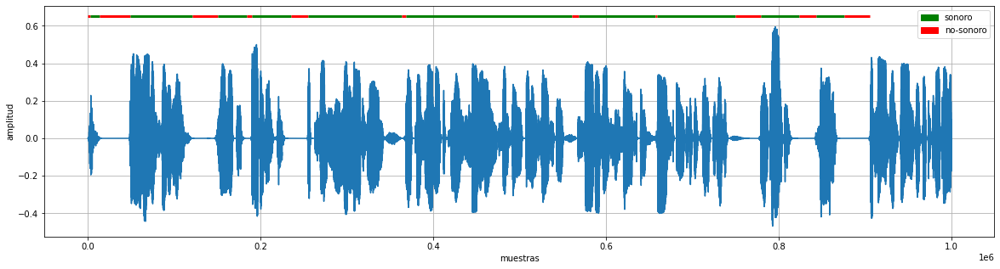

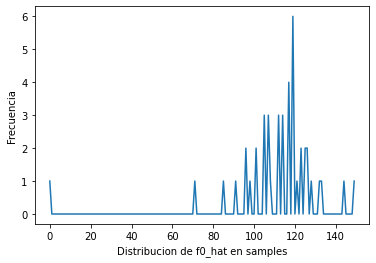

361


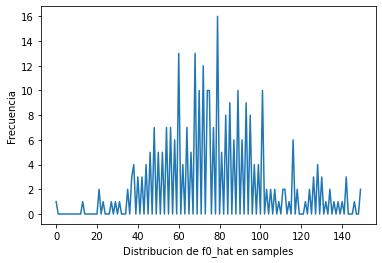

361


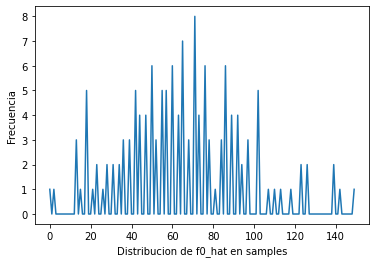

360


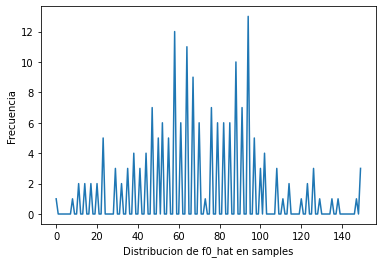

365


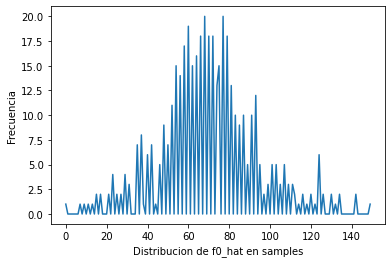

357


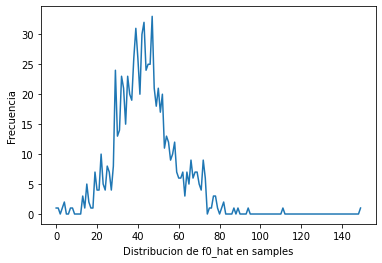

362


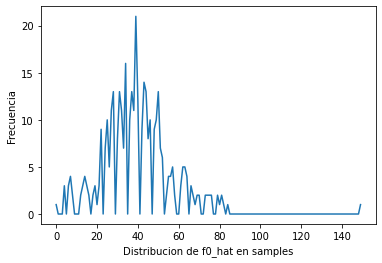

357


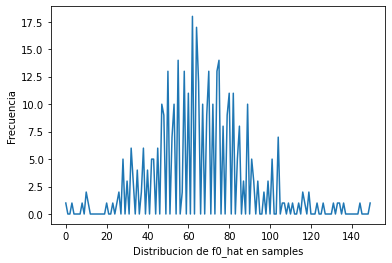

355


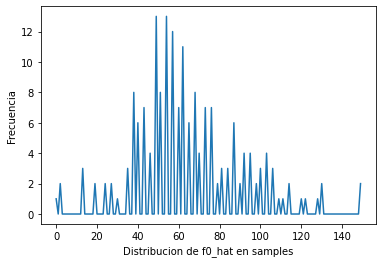

352


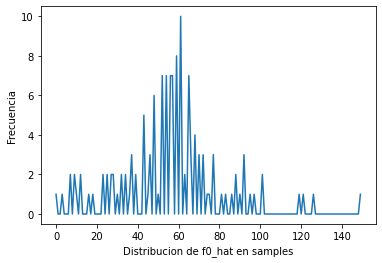

360


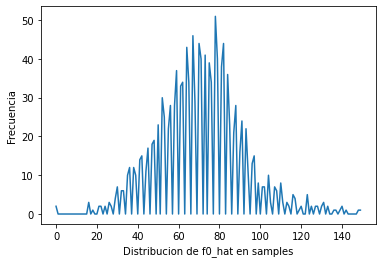

362


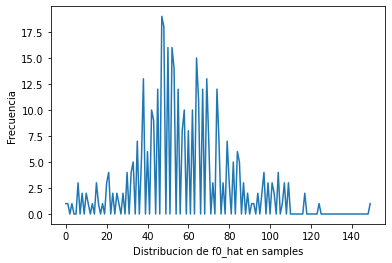

351


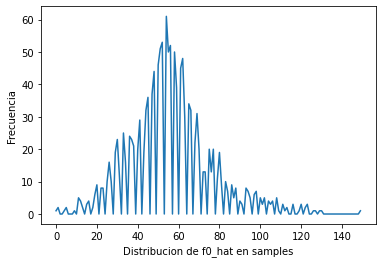

356


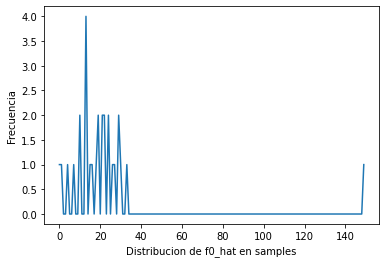

356


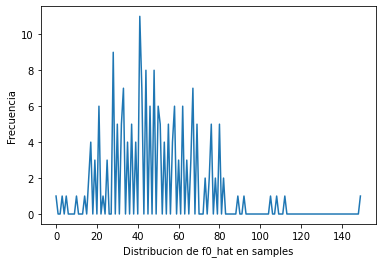

353


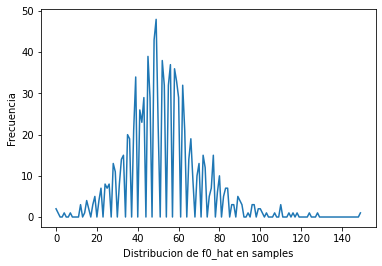

356


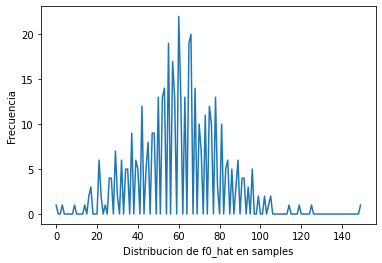

357


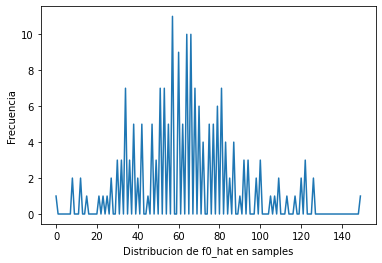

358


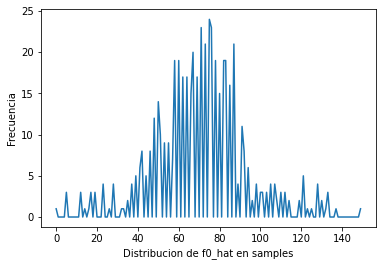

361


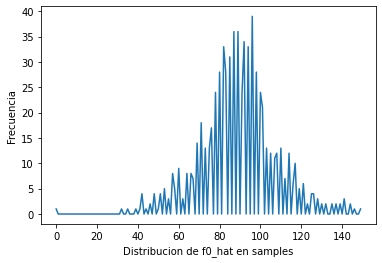

362


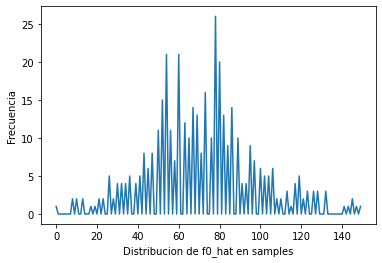

361


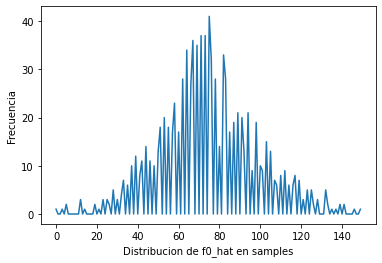

360


In [7]:
# la speed puede ser:
# 1.0, 1.25, 1.5, 1.75, 2.0, 4.0 (siempre con punto)
speed = 2.0

audio_final = speed_up(audio, speed, fs)

Audio(data=audio_final, rate=fs)

2880000
1439455


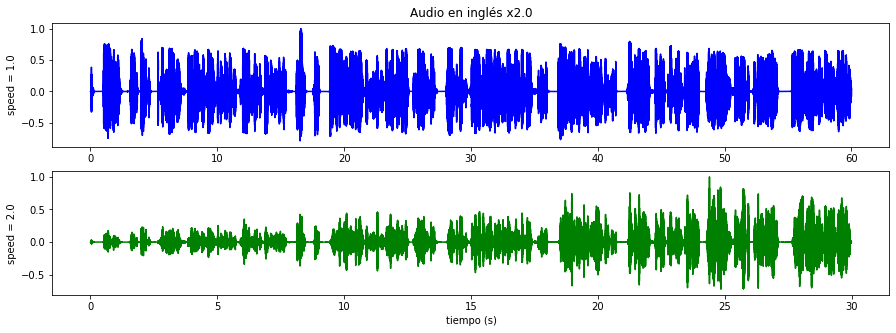

In [12]:

audio_file = audio
audio_f, _ = librosa.load(audio_file, sr=fs, mono=True)
audio_i = float2pcm(audio_f, dtype="int32")
audio_f = librosa.util.normalize(audio_f)
final = librosa.util.normalize(audio_final)

time = np.linspace(0, len(audio_f)//fs, len(audio_f))
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(211)
ax1 = fig.add_subplot(212)
ax.set_title('Audio en inglés x{}'.format(speed))
ax.plot(time, audio_f, 'b') 
print(len(time))
print(len(final))
ax1.plot(time[:len(final)],final, 'g')
ax1.set_xlabel("tiempo (s)")
ax.set_ylabel("speed = 1.0")
ax1.set_ylabel('speed = {}'.format(speed))

plt.show()

In [0]:
from scipy import signal
window = signal.tukey(1000, alpha = 0.1)
plt.plot(window)
plt.title("Tukey window")
plt.ylabel("Amplitude")
plt.xlabel("Sample")
plt.ylim([0, 1.1])